In [3]:
import WikitableScraper as ws
import GeoUtils as gu

import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import numpy as np
import pandas as pd
from sklearn import svm
from sklearn.model_selection import train_test_split

import webbrowser as web
import os
import math

# Constants

In [4]:
TMP_PATH = 'tmp'
EARTHQUAKE_CSV_PATH = 'rsc\\earthquakes.csv'
HTML_TEMPLATE_PATH = 'rsc\\template.html'
HTML_MAP_PATH = 'tmp\\map.html'
HTML_PLACEHOLDERS = ['*PLACEHOLDER*']

# CSV Load, Transform CSV to Json for Openlayers

In [5]:
col_names = pd.read_csv(EARTHQUAKE_CSV_PATH, nrows=0).columns
types_dict = {'Date': str, 'Time': str}
types_dict.update({col: float for col in col_names if col not in types_dict})
csv = pd.read_csv(EARTHQUAKE_CSV_PATH, dtype=types_dict)
csv = csv.rename(columns={'Longitude' : 'lng', 'Latitude' : 'lat'})
json = csv[['lng', 'lat', 'Date', 'Time', 'Magnitude']].to_json(orient='records')

In [6]:
#Load template html and replace *PLACEHOLDER* with the json file
with open(HTML_TEMPLATE_PATH, 'r') as file:
    html_text = file.read().replace(HTML_PLACEHOLDERS[0], json[1:-1])
#Create tmp folder if doesn't exist
if not os.path.exists(TMP_PATH):
    os.makedirs(TMP_PATH)
#Create map.html
with open(HTML_MAP_PATH, 'w') as file:
    file.write(html_text)
#Open map.html in browser
web.open(HTML_MAP_PATH)

True

# Plot graphs

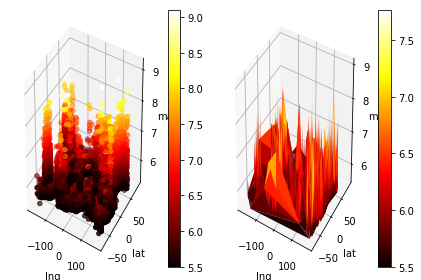

In [7]:
fig = plt.figure()

plot_data = csv[['lng', 'lat', 'Magnitude']]

points_lng = plot_data[['lng']].values.flatten()
points_lat = plot_data[['lat']].values.flatten()
points_mag = plot_data[['Magnitude']].values.flatten()

ax = fig.add_subplot(1, 2, 1, projection='3d')
c = ax.scatter(points_lng, points_lat, points_mag, cmap='hot', c=points_mag)
ax.set_xlabel('lng')
ax.set_ylabel('lat')
ax.set_zlabel('mag')
fig.colorbar(c, ax=ax)

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
c2 = ax2.plot_trisurf(points_lng, points_lat, points_mag, cmap=cm.hot)
ax2.set_xlabel('lng')
ax2.set_ylabel('lat')
ax2.set_zlabel('mag')
fig.colorbar(c2, ax=ax2)
plt.tight_layout()

In [76]:
def euqlidean_dist(X):
    sqr_sum = 0
    for x in X:
        sqr_sum = sqr_sum + x*x
    return math.sqrt(sqr_sum)

def get_mean_norm_values(X):
    return min(X), max(X), (sum(X) / len(X))

def mean_normalize_vector(X):
    min_e, max_e, avg_e = get_mean_norm_values(X)
    x_len = len(X)
    for x in range(x_len):
        if(min_e != max_e): 
            X[x] =  (X[x] - avg_e) / (max_e - min_e)
        else:
            X[x] = 1 / x_len



# Feature normalization

In [81]:
y = csv.head(20)[['Magnitude']].to_numpy()
features = csv.head(20)[['Day', 'Month', 'Year', 'CalendarWeek', 'DayOfYear', 'DayOfWeek', 'Hour', 'Minute', 'Second', 'Depth', 'lng', 'lat']]
for col in features:
    mean_normalize_vector(features[col])
print(features)

Day  Month  Year  CalendarWeek  DayOfYear  DayOfWeek      Hour  \
0  -0.269643  -0.35  0.05         -0.61  -0.557576   0.491667  0.091304   
1  -0.198214  -0.35  0.05         -0.41  -0.496970  -0.341667  0.004348   
2  -0.162500  -0.35  0.05         -0.41  -0.466667  -0.175000  0.308696   
3  -0.055357  -0.35  0.05         -0.41  -0.375758   0.325000  0.308696   
4  -0.019643  -0.35  0.05         -0.41  -0.345455   0.491667  0.091304   
5   0.016071  -0.35  0.05         -0.21  -0.315152  -0.508333  0.091304   
6   0.087500  -0.35  0.05         -0.21  -0.254545  -0.175000  0.091304   
7   0.194643  -0.35  0.05         -0.21  -0.163636   0.325000  0.526087   
8   0.230357  -0.35  0.05         -0.21  -0.133333   0.491667  0.004348   
9   0.266071  -0.35  0.05         -0.01  -0.103030  -0.508333 -0.039130   
10  0.266071  -0.35  0.05         -0.01  -0.103030  -0.508333  0.395652   
11  0.516071  -0.35  0.05          0.19   0.109091  -0.508333 -0.473913   
12  0.694643  -0.35  0.05         

# Regression

In [78]:
regr = svm.SVR()
regr.fit(features.to_numpy(), y)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [79]:
def mse(features, y, regr):
    sqr_sum = 0
    for i in range(len(features)):
        sqr_sum = sqr_sum + math.pow((y[i] - regr.predict([features[i]])), 2)
    return sqr_sum / len(features)

In [80]:
print(mse(features.to_numpy(), y, regr))

0.4014292078095755
